In [17]:
import supervision as sv  # noqa
from rfdetr import RFDETRBase  # noqa
from PIL import Image  # noqa
import requests  # noqa
from io import BytesIO  # noqa

# COCO 80 classes (what RF-DETR was pretrained on)
COCO_CLASSES = [
    "person",
    "bicycle",
    "car",
    "motorcycle",
    "airplane",
    "bus",
    "train",
    "truck",
    "boat",
    "traffic light",
    "fire hydrant",
    "stop sign",
    "parking meter",
    "bench",
    "bird",
    "cat",
    "dog",
    "horse",
    "sheep",
    "cow",
    "elephant",
    "bear",
    "zebra",
    "giraffe",
    "backpack",
    "umbrella",
    "handbag",
    "tie",
    "suitcase",
    "frisbee",
    "skis",
    "snowboard",
    "sports ball",
    "kite",
    "baseball bat",
    "baseball glove",
    "skateboard",
    "surfboard",
    "tennis racket",
    "bottle",
    "wine glass",
    "cup",
    "fork",
    "knife",
    "spoon",
    "bowl",
    "banana",
    "apple",
    "sandwich",
    "orange",
    "broccoli",
    "carrot",
    "hot dog",
    "pizza",
    "donut",
    "cake",
    "chair",
    "couch",
    "potted plant",
    "bed",
    "dining table",
    "toilet",
    "tv",
    "laptop",
    "mouse",
    "remote",
    "keyboard",
    "cell phone",
    "microwave",
    "oven",
    "toaster",
    "sink",
    "refrigerator",
    "book",
    "clock",
    "vase",
    "scissors",
    "teddy bear",
    "hair drier",
    "toothbrush",
]

# Your custom trained class(es)
CUSTOM_CLASSES = ["crane hook"]

# === CHOOSE YOUR MODEL ===
# Option 1: Base pretrained model (detects 80 COCO classes)
CHECKPOINT_PATH = "rf-detr-base.pth"
CLASS_NAMES = COCO_CLASSES

# Option 2: Your fine-tuned model (detects only crane hook)
# CHECKPOINT_PATH = "rf-detr-crane-hook-roboflow.pth"
# CLASS_NAMES = CUSTOM_CLASSES

model = RFDETRBase(pretrain_weights=CHECKPOINT_PATH)
print(f"Loaded model from: {CHECKPOINT_PATH}")
print(f"Using {len(CLASS_NAMES)} classes")

# Debug: verify class order
print(f"\nClass verification (should be elephant=20, zebra=22):")
print(f"  Index 20: {CLASS_NAMES[20]}")
print(f"  Index 21: {CLASS_NAMES[21]}")
print(f"  Index 22: {CLASS_NAMES[22]}")

# Check if model has built-in class names
if hasattr(model, "class_names"):
    print(f"\nModel's class_names (type={type(model.class_names).__name__}):")
    print(f"  {model.class_names}")


Loading pretrain weights
Loaded model from: rf-detr-base.pth
Using 80 classes

Class verification (should be elephant=20, zebra=22):
  Index 20: elephant
  Index 21: bear
  Index 22: zebra

Model's class_names (type=dict):
  {1: 'person', 2: 'bicycle', 3: 'car', 4: 'motorcycle', 5: 'airplane', 6: 'bus', 7: 'train', 8: 'truck', 9: 'boat', 10: 'traffic light', 11: 'fire hydrant', 13: 'stop sign', 14: 'parking meter', 15: 'bench', 16: 'bird', 17: 'cat', 18: 'dog', 19: 'horse', 20: 'sheep', 21: 'cow', 22: 'elephant', 23: 'bear', 24: 'zebra', 25: 'giraffe', 27: 'backpack', 28: 'umbrella', 31: 'handbag', 32: 'tie', 33: 'suitcase', 34: 'frisbee', 35: 'skis', 36: 'snowboard', 37: 'sports ball', 38: 'kite', 39: 'baseball bat', 40: 'baseball glove', 41: 'skateboard', 42: 'surfboard', 43: 'tennis racket', 44: 'bottle', 46: 'wine glass', 47: 'cup', 48: 'fork', 49: 'knife', 50: 'spoon', 51: 'bowl', 52: 'banana', 53: 'apple', 54: 'sandwich', 55: 'orange', 56: 'broccoli', 57: 'carrot', 58: 'hot dog',

In [18]:
def predict_and_visualize(image, confidence=0.5, title=""):
    """Run prediction and visualize results."""
    # Run inference
    detections = model.predict(image, threshold=confidence)

    # Create labels with class names
    labels = []
    if hasattr(detections, "class_id") and len(detections.class_id) > 0:
        for i, class_id in enumerate(detections.class_id):
            class_name = (
                CLASS_NAMES[class_id]
                if class_id < len(CLASS_NAMES)
                else f"unknown_class_{class_id}"
            )
            conf = detections.confidence[i]
            labels.append(f"{class_name} {conf:.2f}")

    # Annotate
    annotated = image.copy()
    annotated = sv.BoxAnnotator(thickness=2).annotate(annotated, detections)
    annotated = sv.LabelAnnotator(text_scale=0.5, text_padding=5).annotate(
        annotated, detections, labels
    )

    print(f"\n{title}")
    print(f"Found {len(labels)} detections")

    # Print detailed detection info with raw class_id for debugging
    if labels:
        raw_ids = [int(x) for x in detections.class_id]
        print(f"  Raw class_ids from model: {raw_ids}")
        for i, label in enumerate(labels):
            class_id = int(detections.class_id[i])
            bbox = detections.xyxy[i]
            print(
                f"  [{i + 1}] id={class_id} -> CLASS_NAMES[{class_id}]='{CLASS_NAMES[class_id] if class_id < len(CLASS_NAMES) else 'OOB'}'"
            )
    sv.plot_image(annotated)

    return detections

## Test on Local Images (Crane Hooks)


In [3]:
# Test on your local test images
local_images = [
    "test_1.png",
    "test_2.png",
    "test_3.jpg",
    "test_4.jpg",
    "test_5.jpeg",
    "test_6.jpeg",
    "test_7.png",
    "test_8.jpeg",
]

for img_path in local_images:
    try:
        image = Image.open(img_path)
        predict_and_visualize(image, confidence=0.5, title=f"📍 {img_path}")
    except FileNotFoundError:
        print(f"Skipping {img_path} (not found)")

Skipping test_1.png (not found)
Skipping test_2.png (not found)
Skipping test_3.jpg (not found)
Skipping test_4.jpg (not found)
Skipping test_5.jpeg (not found)
Skipping test_6.jpeg (not found)
Skipping test_7.png (not found)
Skipping test_8.jpeg (not found)


## Test on COCO Images (Various Objects)

Testing on diverse COCO images to see how the model performs on:

- Objects similar to crane hooks (industrial/mechanical)
- Completely different objects (to verify it doesn't over-detect)


In [13]:
def load_image_from_url(url):
    """Load image from URL."""
    response = requests.get(url, timeout=10)
    response.raise_for_status()
    return Image.open(BytesIO(response.content))


# COCO validation images - diverse set
COCO_TEST_IMAGES = [
    # Industrial/mechanical (similar domain - might trigger detections)
    ("http://images.cocodataset.org/val2017/000000057027.jpg", "Construction site"),
    ("http://images.cocodataset.org/val2017/000000226111.jpg", "Truck/machinery"),
    # Objects with hooks or similar shapes
    ("http://images.cocodataset.org/val2017/000000087038.jpg", "Umbrella (curved shape)"),
    ("http://images.cocodataset.org/val2017/000000284296.jpg", "Sports equipment"),
    # Completely different (should have zero detections)
    ("http://images.cocodataset.org/val2017/000000039769.jpg", "Cats on couch"),
    ("http://images.cocodataset.org/val2017/000000037777.jpg", "Baseball game"),
    ("http://images.cocodataset.org/val2017/000000397133.jpg", "Kitchen scene"),
    ("http://images.cocodataset.org/val2017/000000252219.jpg", "Street scene"),
    ("http://images.cocodataset.org/val2017/000000087144.jpg", "People dining"),
    ("http://images.cocodataset.org/val2017/000000174482.jpg", "Living room"),
]

print(f"Testing on {len(COCO_TEST_IMAGES)} COCO images...")

Testing on 10 COCO images...


Model is not optimized for inference. Latency may be higher than expected. You can optimize the model for inference by calling model.optimize_for_inference().



🖼️ COCO: Construction site
Found 4 detections
  Raw class_ids from model: [22, 22, 22, 22]
  [1] id=22 -> CLASS_NAMES[22]='zebra'
  [2] id=22 -> CLASS_NAMES[22]='zebra'
  [3] id=22 -> CLASS_NAMES[22]='zebra'
  [4] id=22 -> CLASS_NAMES[22]='zebra'


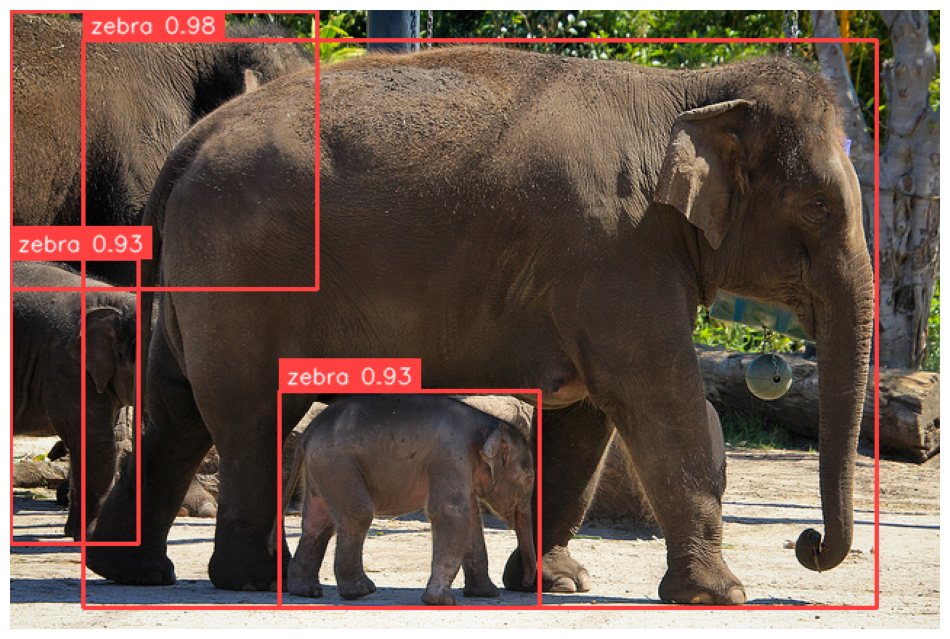


🖼️ COCO: Truck/machinery
Found 0 detections


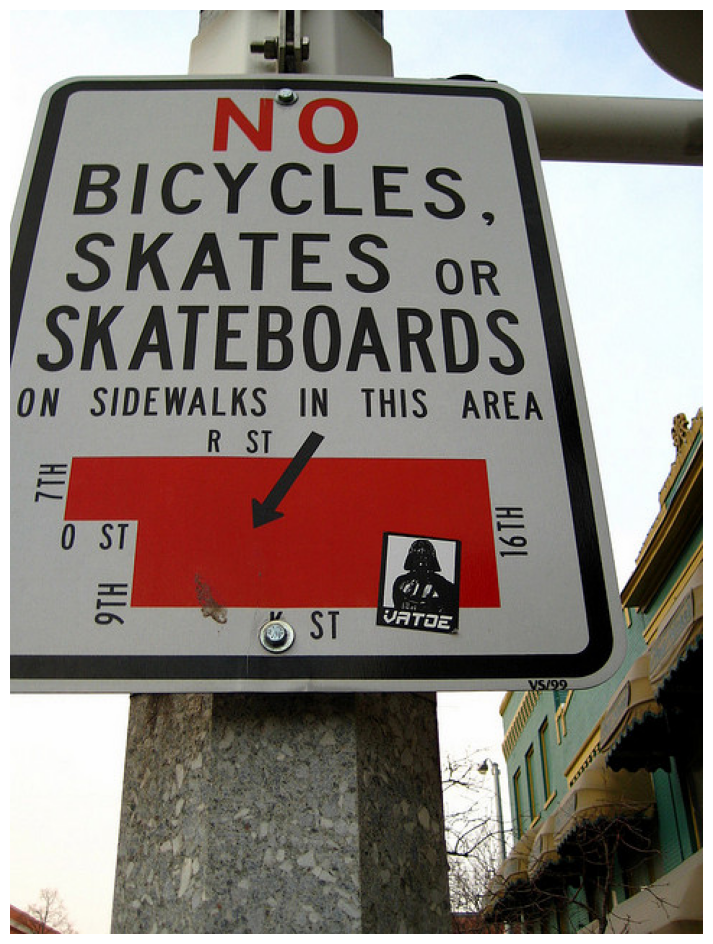


🖼️ COCO: Umbrella (curved shape)
Found 11 detections
  Raw class_ids from model: [1, 41, 1, 2, 1, 1, 1, 1, 1, 1, 1]
  [1] id=1 -> CLASS_NAMES[1]='bicycle'
  [2] id=41 -> CLASS_NAMES[41]='cup'
  [3] id=1 -> CLASS_NAMES[1]='bicycle'
  [4] id=2 -> CLASS_NAMES[2]='car'
  [5] id=1 -> CLASS_NAMES[1]='bicycle'
  [6] id=1 -> CLASS_NAMES[1]='bicycle'
  [7] id=1 -> CLASS_NAMES[1]='bicycle'
  [8] id=1 -> CLASS_NAMES[1]='bicycle'
  [9] id=1 -> CLASS_NAMES[1]='bicycle'
  [10] id=1 -> CLASS_NAMES[1]='bicycle'
  [11] id=1 -> CLASS_NAMES[1]='bicycle'


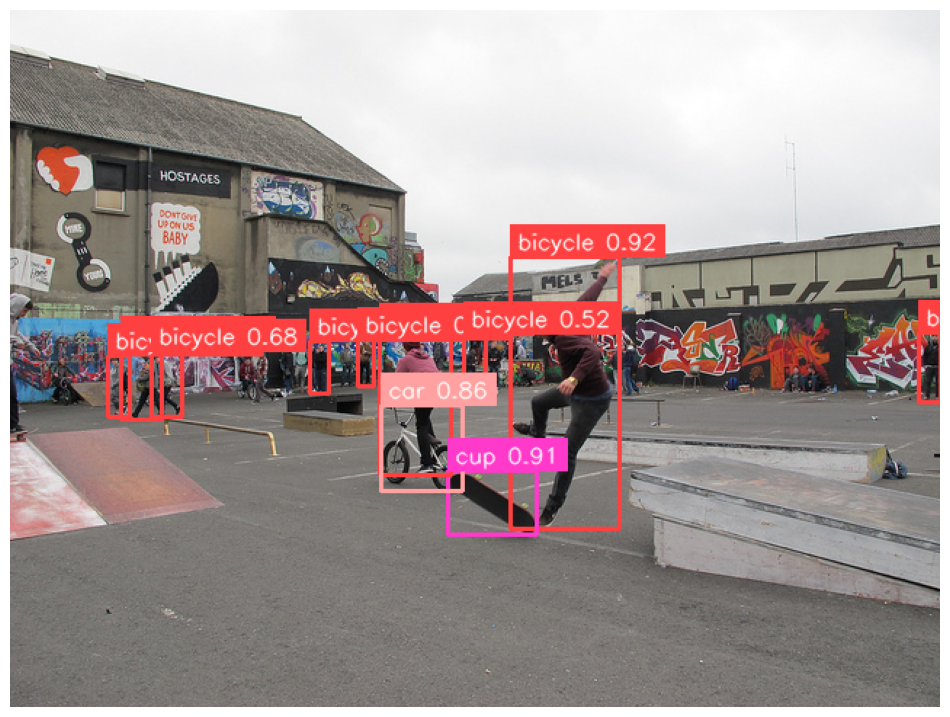


🖼️ COCO: Sports equipment
Found 3 detections
  Raw class_ids from model: [25, 25, 25]
  [1] id=25 -> CLASS_NAMES[25]='umbrella'
  [2] id=25 -> CLASS_NAMES[25]='umbrella'
  [3] id=25 -> CLASS_NAMES[25]='umbrella'


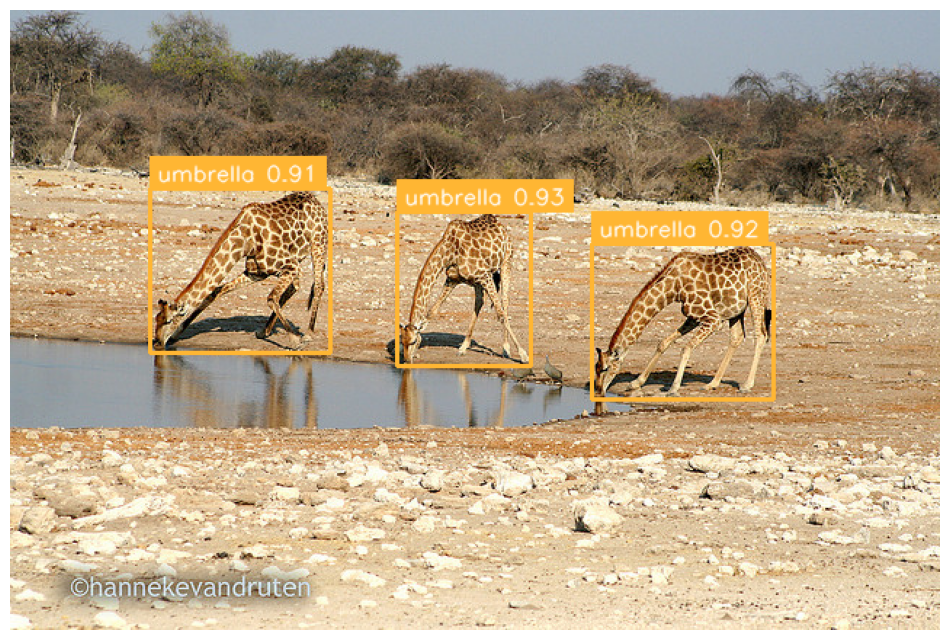


🖼️ COCO: Cats on couch
Found 5 detections
  Raw class_ids from model: [17, 17, 75, 75, 63]
  [1] id=17 -> CLASS_NAMES[17]='horse'
  [2] id=17 -> CLASS_NAMES[17]='horse'
  [3] id=75 -> CLASS_NAMES[75]='vase'
  [4] id=75 -> CLASS_NAMES[75]='vase'
  [5] id=63 -> CLASS_NAMES[63]='laptop'


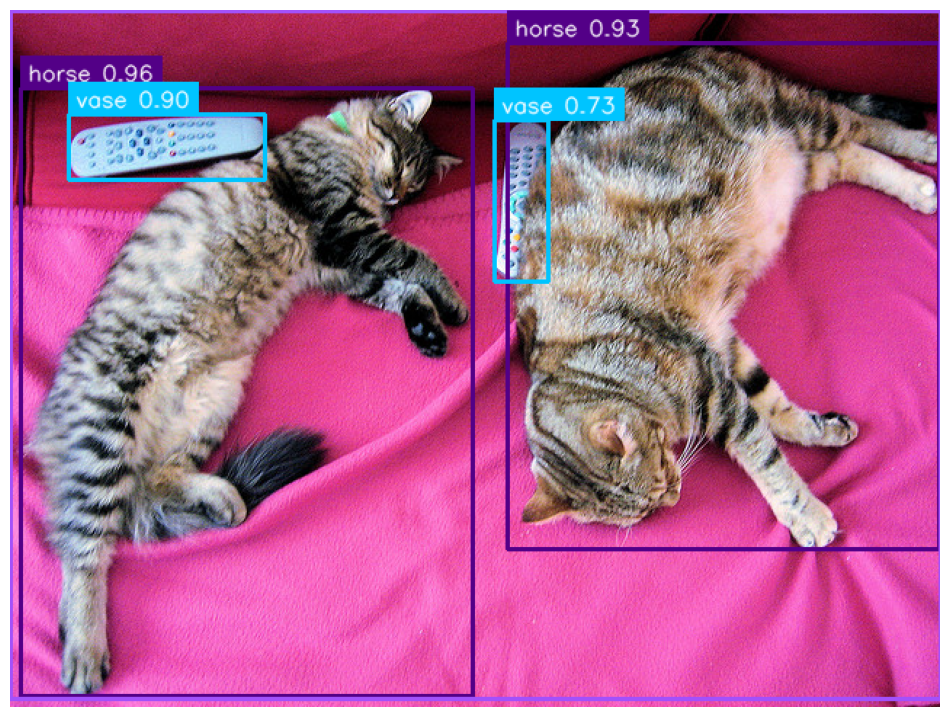


🖼️ COCO: Baseball game
Found 13 detections
  Raw class_ids from model: [82, 67, 62, 79, 62, 55, 55, 55, 52, 55, 62, 55, 64]
  [1] id=82 -> CLASS_NAMES[82]='OOB'
  [2] id=67 -> CLASS_NAMES[67]='cell phone'
  [3] id=62 -> CLASS_NAMES[62]='tv'
  [4] id=79 -> CLASS_NAMES[79]='toothbrush'
  [5] id=62 -> CLASS_NAMES[62]='tv'
  [6] id=55 -> CLASS_NAMES[55]='cake'
  [7] id=55 -> CLASS_NAMES[55]='cake'
  [8] id=55 -> CLASS_NAMES[55]='cake'
  [9] id=52 -> CLASS_NAMES[52]='hot dog'
  [10] id=55 -> CLASS_NAMES[55]='cake'
  [11] id=62 -> CLASS_NAMES[62]='tv'
  [12] id=55 -> CLASS_NAMES[55]='cake'
  [13] id=64 -> CLASS_NAMES[64]='mouse'


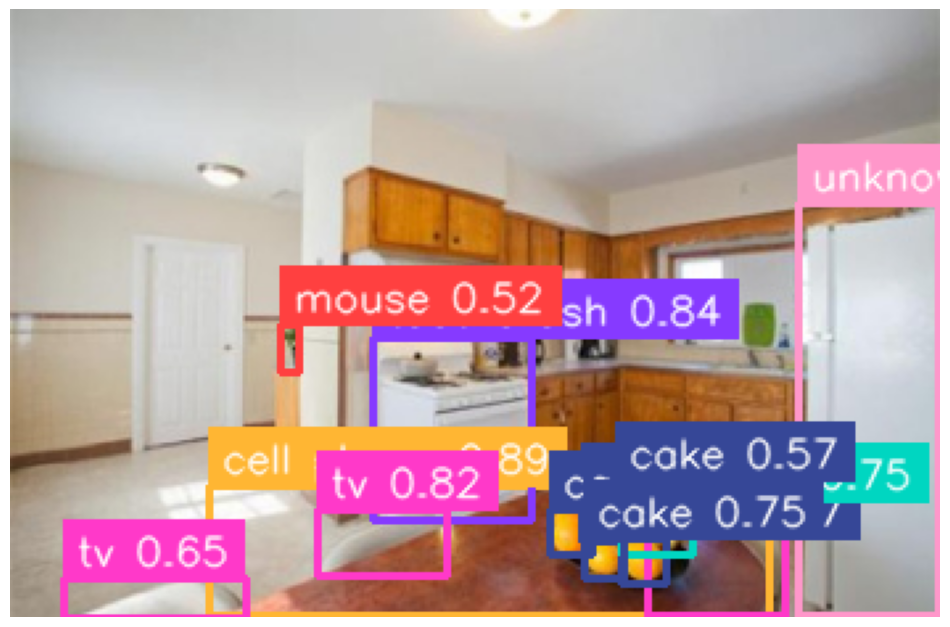


🖼️ COCO: Kitchen scene
Found 12 detections
  Raw class_ids from model: [1, 51, 51, 51, 1, 51, 64, 81, 51, 47, 79, 50]
  [1] id=1 -> CLASS_NAMES[1]='bicycle'
  [2] id=51 -> CLASS_NAMES[51]='carrot'
  [3] id=51 -> CLASS_NAMES[51]='carrot'
  [4] id=51 -> CLASS_NAMES[51]='carrot'
  [5] id=1 -> CLASS_NAMES[1]='bicycle'
  [6] id=51 -> CLASS_NAMES[51]='carrot'
  [7] id=64 -> CLASS_NAMES[64]='mouse'
  [8] id=81 -> CLASS_NAMES[81]='OOB'
  [9] id=51 -> CLASS_NAMES[51]='carrot'
  [10] id=47 -> CLASS_NAMES[47]='apple'
  [11] id=79 -> CLASS_NAMES[79]='toothbrush'
  [12] id=50 -> CLASS_NAMES[50]='broccoli'


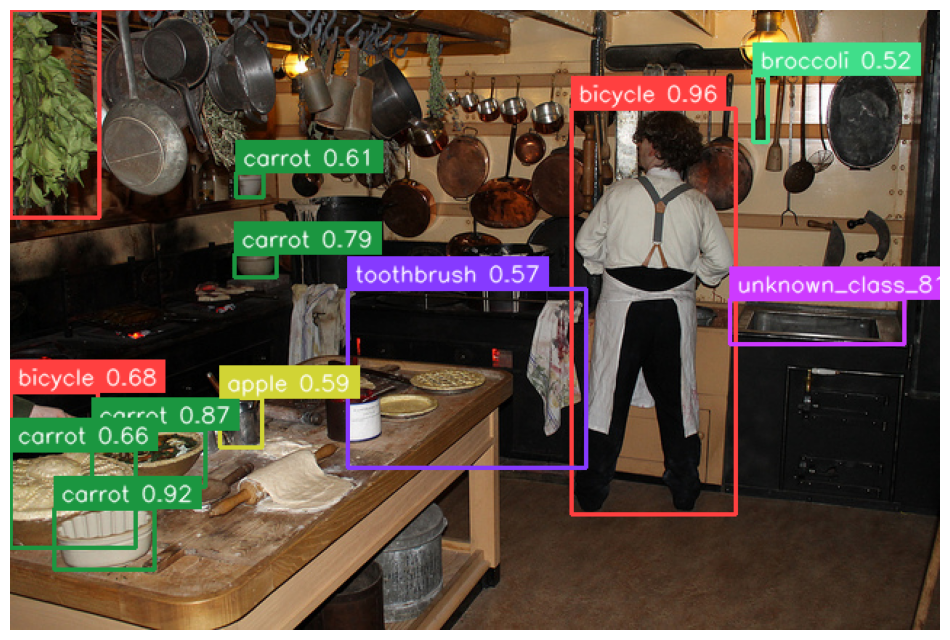


🖼️ COCO: Street scene
Found 5 detections
  Raw class_ids from model: [1, 1, 1, 28, 10]
  [1] id=1 -> CLASS_NAMES[1]='bicycle'
  [2] id=1 -> CLASS_NAMES[1]='bicycle'
  [3] id=1 -> CLASS_NAMES[1]='bicycle'
  [4] id=28 -> CLASS_NAMES[28]='suitcase'
  [5] id=10 -> CLASS_NAMES[10]='fire hydrant'


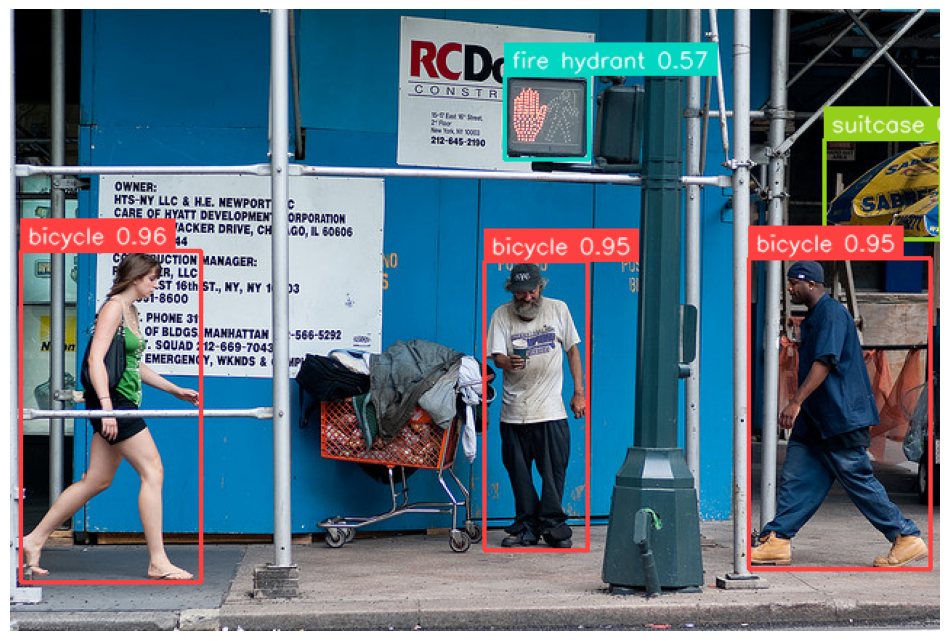


🖼️ COCO: People dining
Found 6 detections
  Raw class_ids from model: [1, 1, 1, 3, 15, 31]
  [1] id=1 -> CLASS_NAMES[1]='bicycle'
  [2] id=1 -> CLASS_NAMES[1]='bicycle'
  [3] id=1 -> CLASS_NAMES[1]='bicycle'
  [4] id=3 -> CLASS_NAMES[3]='motorcycle'
  [5] id=15 -> CLASS_NAMES[15]='cat'
  [6] id=31 -> CLASS_NAMES[31]='snowboard'


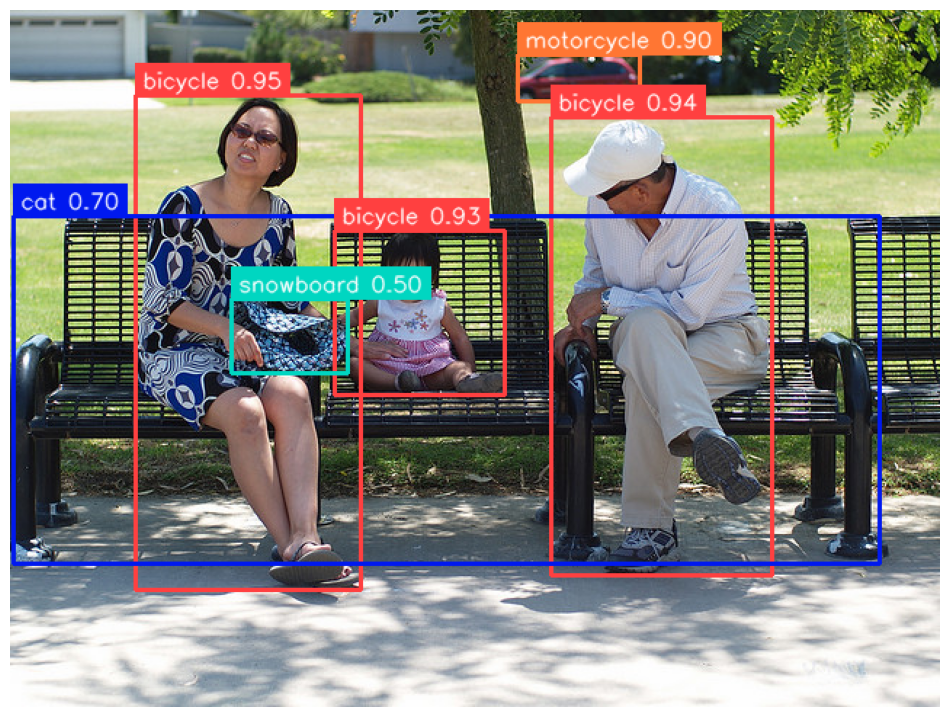


🖼️ COCO: Living room
Found 6 detections
  Raw class_ids from model: [2, 3, 3, 3, 3, 10]
  [1] id=2 -> CLASS_NAMES[2]='car'
  [2] id=3 -> CLASS_NAMES[3]='motorcycle'
  [3] id=3 -> CLASS_NAMES[3]='motorcycle'
  [4] id=3 -> CLASS_NAMES[3]='motorcycle'
  [5] id=3 -> CLASS_NAMES[3]='motorcycle'
  [6] id=10 -> CLASS_NAMES[10]='fire hydrant'


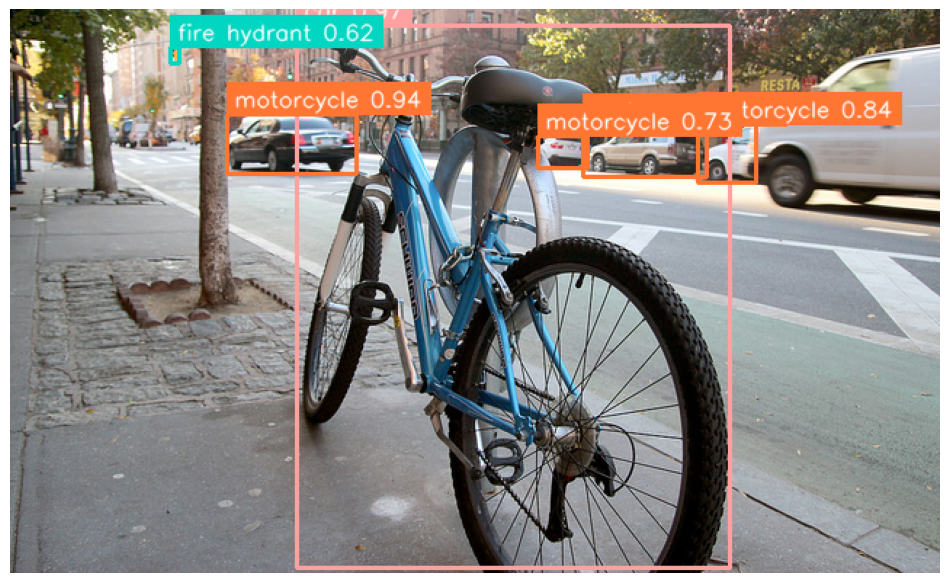

In [19]:
# Run inference on each COCO image
results_summary = []

for url, description in COCO_TEST_IMAGES:
    try:
        image = load_image_from_url(url)
        detections = predict_and_visualize(image, confidence=0.5, title=f"🖼️ COCO: {description}")

        num_detections = len(detections.xyxy) if hasattr(detections, "xyxy") else 0
        results_summary.append((description, num_detections))

    except Exception as e:
        print(f"Error loading {description}: {e}")
        results_summary.append((description, "error"))

In [ ]:
# Summary
print("\n" + "=" * 50)
print("RESULTS SUMMARY")
print("=" * 50)
print(f"{'Image':<30} {'Detections':>15}")
print("-" * 50)
for desc, count in results_summary:
    print(f"{desc:<30} {str(count):>15}")
print("=" * 50)

# Ideally: 0 detections on non-crane-hook images
# If you see detections on random COCO images, the model may be overfitting

## Test with Different Confidence Thresholds


In [ ]:
# Test on a crane hook image with different confidence thresholds
test_image = Image.open("test_8.jpeg")  # Change to your best test image

for conf in [0.3, 0.5, 0.7, 0.9]:
    predict_and_visualize(test_image, confidence=conf, title=f"Confidence threshold: {conf}")